# SSD SETUP


In [1]:
!pip install tensorflow==2.8
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 668.3 MB 19 kB/s 
     |████████████████████████████████| 462 kB 5.0 MB/s 
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.2+zzzcolab20220719082949
    Uninstalling tensorflow-2.8.2+zzzcolab20220719082949:
      Successfully uninstalled tensorflow-2.8.2+zzzcolab20220719082949
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following packages will be REMOVED:
  libcudnn8-dev
The following held packages will be changed:
  libcudnn8
The following packages will be upgraded:
  libcudnn8
1 upgraded, 0 newly installed, 1 to remove and 18 not upgraded.
Need to get 430 MB of archives.
After this operation, 3,139 MB disk space will be freed.

In [2]:
# Library used to evaluate train & compile model
!pip install tf_slim

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 352 kB 5.1 MB/s 


In [3]:
# Library to work with cocodata set (Helps to interact with coco dataset)
!pip install pycocotools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
# importing necessary library to nevigate tensorflow model available on github
import os # The os module in python provide function for creating and removing a directory (folder), fetching its content changing and identifying the current directory etc...
import pathlib # The module classes offeres represnting filesystem path with semantic appropriate for different operating system

In [5]:
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..') # Create new directory
elif not pathlib.Path("models").exists():
  !git clone --depth 1 https://github.com/tensorflow/models  # Clone git repo


Cloning into 'models'...
remote: Enumerating objects: 3491, done.
remote: Counting objects: 100% (3491/3491), done.
remote: Compressing objects: 100% (2912/2912), done.
remote: Total 3491 (delta 909), reused 1422 (delta 526), pack-reused 0
Receiving objects: 100% (3491/3491), 46.95 MiB | 26.03 MiB/s, done.
Resolving deltas: 100% (909/909), done.


# Compiling protobuf and installing object detection packages

In [6]:
# bash is a linux command line
%%bash
cd models/research
protoc object_detection/protos/*.proto --python_out=.


In [7]:
# install tf2 packages
%%bash
cd /content/models/research/object_detection/packages/tf2
pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research/object_detection/packages/tf2
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1236 sha256=c74c5e9cd286f4e8c6842c75df0723c2fa0977f5e56a0675658d43dfaf12799a
  Stored in directory: /tmp/pip-ephem-wheel-cache-qyucbzvd/wheels/d3/af/d9/d9a25faaa2ce4aef17ef6a07f9bb33d386281f8f3580bce973
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22257 sha256=dee00fa29a16c227d0864d1b573bdb4655b8f63e33d80f17752c6a349b72ea73
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78544 sha256=6443ad6b3002dd0527cb4f4d859c1d8eeea4c8299acf6802d25617b001fa29d1
  Stored in directory: /root/.cache/pip/wheels/a4/61/fd/c57e374e580aa78a45ed78d5859b3a44436af17e22ca53284f
  Created wheel for av

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.


# Necessary Imports

In [8]:
import numpy as np
import six.moves.urllib as urlib  #Navigate the url
import sys  # navigate the system resources
import tarfile # load file in tar format (Just like zip)
import tensorflow as tf
import zipfile
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

# Importing Object Detection Library

In [9]:
cd /content/models/research

/content/models/research


In [10]:
from object_detection.utils import ops as utils_ops, label_map_util, visualization_utils as vis_utils

# utils_ops : Help to getting the output

In [11]:
# patch tf1 to utilsops
utils_ops.tf = tf.compat.v1

# Patch the location of gflie
tf.gfile = tf.io.gfile

# Model Preparation

### Any model  exported using  export_inference_graph.py  tool can be  loaded here simply  by changing path

## Default model used is SSD mobilenet.Refer for other models [Detection model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md)

In [12]:
def load_model(model_name):
  base_url='http://download.tensorflow.org/models/object_detection/tf2/20200711/'
  
  model_file=model_name+'.tar.gz'
  model_dir=tf.keras.utils.get_file(fname=model_name,origin=base_url+ model_file,untar=True)

  model_dir=pathlib.Path(model_dir)/"saved_model"

  model=tf.saved_model.load(str(model_dir))
  return model

# Loading LabelMap

In [13]:
PATH_TO_LABELS = '/content/models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)  # Convert pbtxt file into category index

In [14]:
# Testing the test images
PATH_TO_TEST_IMAGE_DIR = pathlib.Path('/content/models/research/object_detection/test_images')
TEST_IMAGE_PATH = sorted(list(PATH_TO_TEST_IMAGE_DIR.glob('*.jpg')))
TEST_IMAGE_PATH

[PosixPath('/content/models/research/object_detection/test_images/image1.jpg'),
 PosixPath('/content/models/research/object_detection/test_images/image2.jpg'),
 PosixPath('/content/models/research/object_detection/test_images/image3.jpg')]

# Detection

In [15]:
model_name = 'ssd_mobilenet_v2_320x320_coco17_tpu-8'
#'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz'
detection_model = load_model(model_name)

46042990/46042990 [==============================] - 0s 0us/step


In [16]:
# Inputs of models
detection_model.signatures['serving_default'].inputs

[<tf.Tensor 'input_tensor:0' shape=(1, None, None, 3) dtype=uint8>,
 <tf.Tensor 'unknown:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_0:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_1:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_2:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_3:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_4:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_5:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_6:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_7:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_8:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_9:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_10:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_11:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_12:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_13:0' shape=<unknown> dtype=resource>,
 <tf.Tensor 'unknown_14:0' shape=<unknown> dt

In [18]:
# Checking the output datatypes
detection_model.signatures['serving_default'].output_dtypes

{'raw_detection_scores': tf.float32,
 'detection_boxes': tf.float32,
 'detection_scores': tf.float32,
 'detection_anchor_indices': tf.float32,
 'raw_detection_boxes': tf.float32,
 'detection_multiclass_scores': tf.float32,
 'num_detections': tf.float32,
 'detection_classes': tf.float32}

In [19]:
# Shapes of output
detection_model.signatures['serving_default'].output_shapes

{'raw_detection_scores': TensorShape([1, 1917, 91]),
 'detection_boxes': TensorShape([1, 100, 4]),
 'detection_scores': TensorShape([1, 100]),
 'detection_anchor_indices': TensorShape([1, 100]),
 'raw_detection_boxes': TensorShape([1, 1917, 4]),
 'detection_multiclass_scores': TensorShape([1, 100, 91]),
 'num_detections': TensorShape([1]),
 'detection_classes': TensorShape([1, 100])}

# Add Funtion to call the model & cleanup the outputs

In [20]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image) # Image convert into array
  input_tensor = tf.convert_to_tensor(image) # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = input_tensor[tf.newaxis,...] # The model expects a batch of images, so add an axis with `tf.newaxis`.

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections


  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

# Run on each test image and show the result

In [21]:
def show_inference(model, image_path):
  image_np = np.array(Image.open(image_path)) # the array based representation of the image will be used later in order to prepare the result image with boxes and labels on it.
  
  
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)


  # Visualization of the results of a detection.
  vis_utils.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

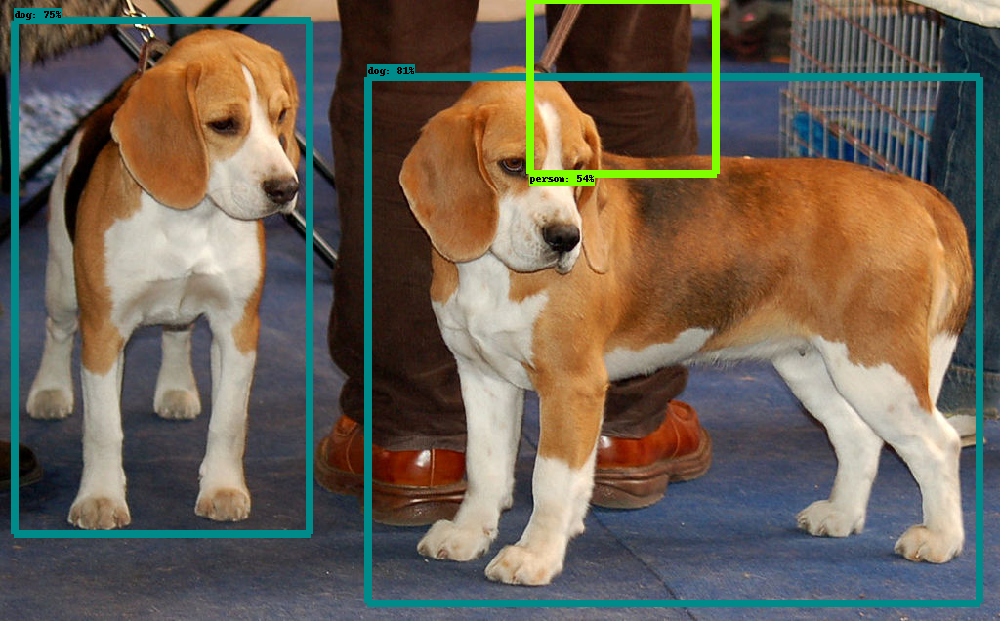

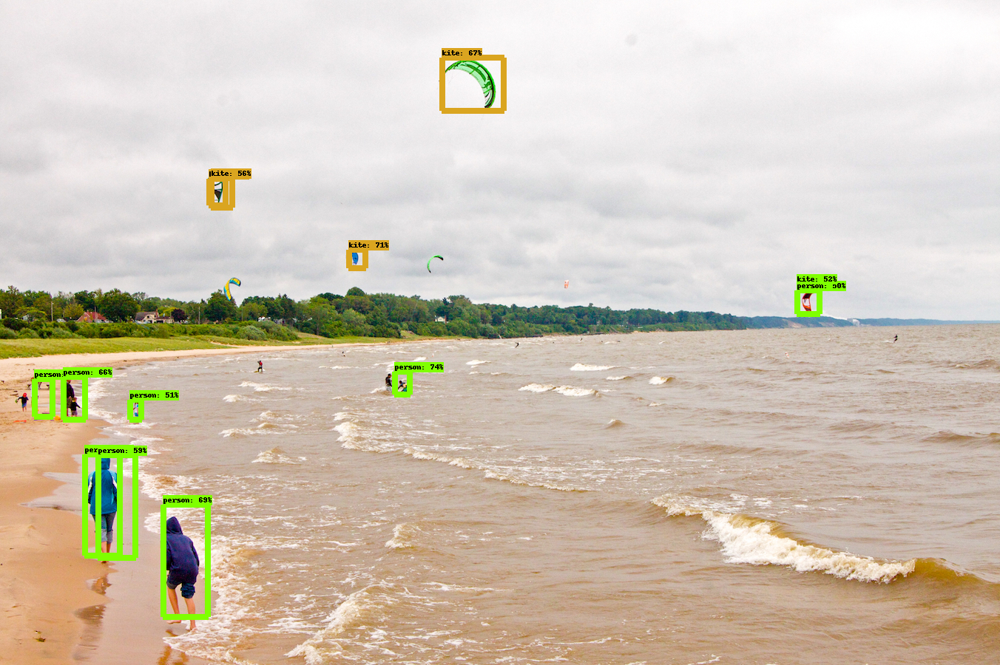

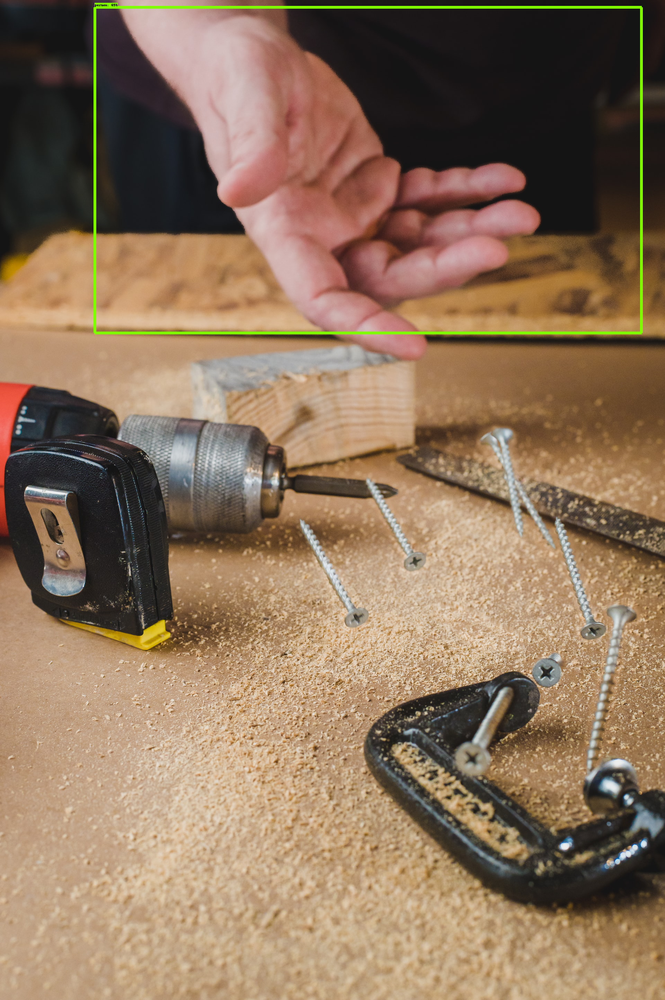

In [22]:
for image_path in TEST_IMAGE_PATH:
  show_inference(detection_model, image_path)